# (For colab)

In [ ]:
!pip install -U https://github.com/conda-incubator/condacolab/archive/cuda-version-12.tar.gz
import condacolab
condacolab.install_mambaforge()
!wget -q https://raw.githubusercontent.com/openforcefield/symposium_2024_demo/main/colab-environment.yml
!wget -q https://raw.githubusercontent.com/openforcefield/symposium_2024_demo/main/last_frame_lig.pdb
!mamba env update -q --name=base --file=colab-environment.yml

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

# General imports

In [6]:
from pathlib import Path

import ipywidgets as widgets
import mdtraj
import nglview
import numpy
import numpy as np
import openmm
import openmm.unit as omm_unit
import rdkit
from openff.interchange import Interchange
from openff.interchange.drivers.openmm import get_openmm_energies
from openff.toolkit import AmberToolsToolkitWrapper, ForceField, Molecule, Topology
from openff.toolkit.utils.nagl_wrapper import NAGLToolkitWrapper
from openff.units import Quantity, ensure_quantity, unit
from openff.units.openmm import from_openmm
from openmm.app import Simulation
from pdbfixer import PDBFixer

# Warm up NAGL
ntkw = NAGLToolkitWrapper()
ntkw.assign_partial_charges(Molecule.from_smiles('C'), "openff-gnn-am1bcc-0.1.0-rc.3.pt")

# RDKit UGM 2024 OpenFF Demo
## From RDKit to MD simulation in seconds
#### Assign parameters to a molecule from SDF

In [66]:
rdmol = rdkit.Chem.MolFromMolFile("aspirin.sdf")
offmol = Molecule.from_rdkit(rdmol)
forcefield = ForceField("openff-2.2.0.offxml")
interchange = forcefield.create_interchange(offmol.to_topology())

#### Run and visualize a standard OpenMM simulation

In [8]:
def simulate_and_visualize(interchange):
    # OpenMM setup boilerplate
    integrator = openmm.LangevinMiddleIntegrator(
            300 * omm_unit.kelvin,
            1 / omm_unit.picosecond,
            0.002 * omm_unit.picoseconds,
        )
    
    simulation = interchange.to_openmm_simulation(integrator)
    simulation.minimizeEnergy(tolerance=100)
    dcd_reporter = openmm.app.DCDReporter(file="trajectory.dcd", 
                                          reportInterval=10
                                         )
    simulation.reporters.append(dcd_reporter)
    simulation.step(1000)
    # Visualize the trakectory
    trajectory: mdtraj.Trajectory = mdtraj.load(
        "trajectory.dcd", top=mdtraj.Topology.from_openmm(interchange.to_openmm_topology())
    )
    view = nglview.show_mdtraj(trajectory)
    view.add_representation("line", selection="protein")
    view.add_line(selection="water")
    return view

simulate_and_visualize(interchange)

NGLWidget(max_frame=99)

## A brief intro to OpenFF objects, and setting up a protein-ligand simulation

In [69]:
from openff.toolkit import ForceField, Molecule, Topology

top = Topology.from_pdb(
    "complex_topology.pdb",
    unique_molecules=[Molecule.from_smiles("c12c(Cl)cccc1sc(C(=O)[O-])c(Cl)2")],
)
protein = top.molecule(0)
ligand = top.molecule(1)
top.visualize()

NGLWidget()

In [70]:
# Solvate the topology
top.to_file('temp.pdb')
fixer = PDBFixer('temp.pdb')
fixer.addSolvent(
    padding=0.5 * omm_unit.nanometer, ionicStrength=0.15 * omm_unit.molar
)

with open("receptor_solvated.pdb", "w") as f:
    openmm.app.PDBFile.writeFile(fixer.topology, fixer.positions, f)
top = Topology.from_pdb("receptor_solvated.pdb", 
                        unique_molecules=[top.molecule(1)])

In [71]:
top.visualize()

NGLWidget()

In [72]:
# NOTE: Hierarchical parameter application (last match wins)
ff = ForceField("openff-2.2.0.offxml", "ff14sb_off_impropers_0.0.4.offxml")
# NOTE: AM1BCC happens in the background using RDKit+AmberTools
interchange = ff.create_interchange(top)
integrator = openmm.LangevinMiddleIntegrator(
        300 * omm_unit.kelvin,
        1 / omm_unit.picosecond,
        0.002 * omm_unit.picoseconds,
    )

simulation = interchange.to_openmm_simulation(integrator)
simulation.minimizeEnergy(tolerance=100)
dcd_reporter = openmm.app.DCDReporter(file="trajectory.dcd", 
                                      reportInterval=10
                                     )
simulation.reporters.append(dcd_reporter)
simulation.step(1000)


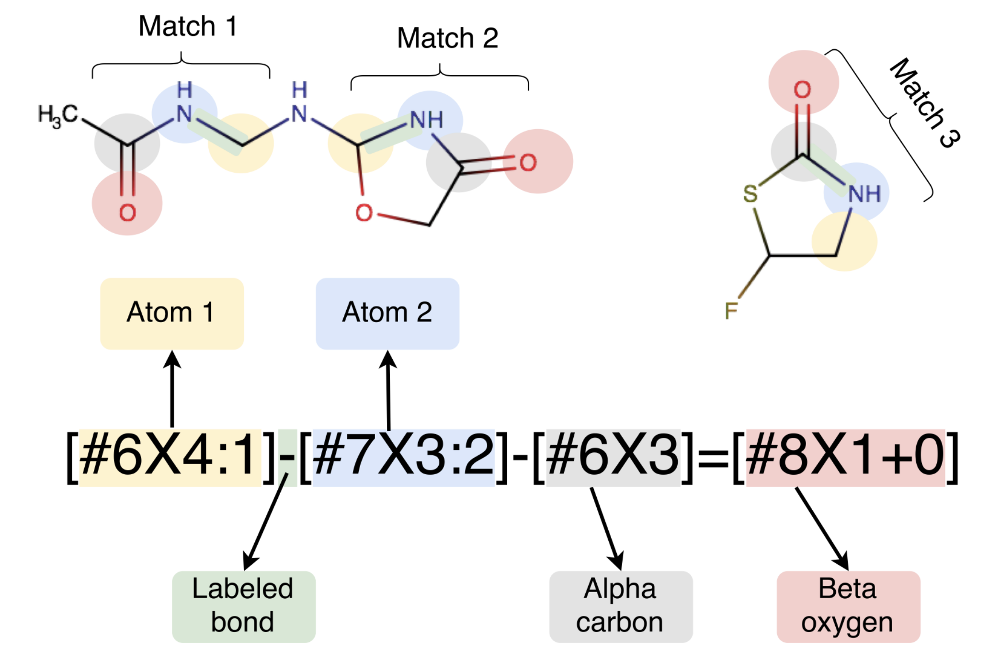
## Let's take a look at OpenFF-2.2.0



```
...

<Bond smirks="[#16X4,#16X3:1]~[#7:2]" id="b57" length="1.7177 A" k="351.2 kcal_per_mol A**-2"
<Bond smirks="[#16X4,#16X3:1]~[#7X2:2]" id="b57a" length="1.642 A" k="479.6 * kcal_per_mol A**-2"

...

Proper smirks="[*:1]-[#6X4:2]-[#6X3:3]=[*:4]" per="2" phase="0.0 degree" id="t18" k1="-0.447 * kcal_per_mol" 
Proper smirks="[*:1]-[#6X4:2]-[#6X3:3](~[#8X1])~[#8X1:4]" per="2" phase="0.0 degree " id="t18a" k1="-0.2045 * kcal_per_mol"
Proper smirks="[*:1]-[#6X4:2]-[#6X3:3](~!@[#7X3])~!@[#7X3:4]" per="2" phase="0.0 degree" id="t18b" k1="-0.1892 * kcal_per_mol"

...

<ToolkitAM1BCC version="0.3"></ToolkitAM1BCC>
```

In [73]:
trajectory: mdtraj.Trajectory = mdtraj.load(
    "trajectory.dcd", top=mdtraj.Topology.from_openmm(interchange.to_openmm_topology())
)
view = nglview.show_mdtraj(trajectory.image_molecules())
view.add_representation("line", selection="protein")
view.add_line(selection="water")
view

NGLWidget(max_frame=99)

* OpenFF can load PDBs consisting of the 20 canonical amino acids, waters, common salts, and user-defined small molecules. (So, relaxed openfold outputs are A-OK!)
* OpenFF force field application is hierarchical, so multiple force fields can be joined together. 
* OpenFF assigns partial charges using a fully open-source backend, leveraging RDKit and Ambertools.



# Making a ligand mutation design loop

In [15]:
view = nglview.show_structure_file("selected_prediction_aligned.pdb")
view.add_representation("surface", selection="protein", opacity=0.7, opaqueBack=False)
view.add_component("4hw3_D_aligned.pdb")
view

NGLWidget()


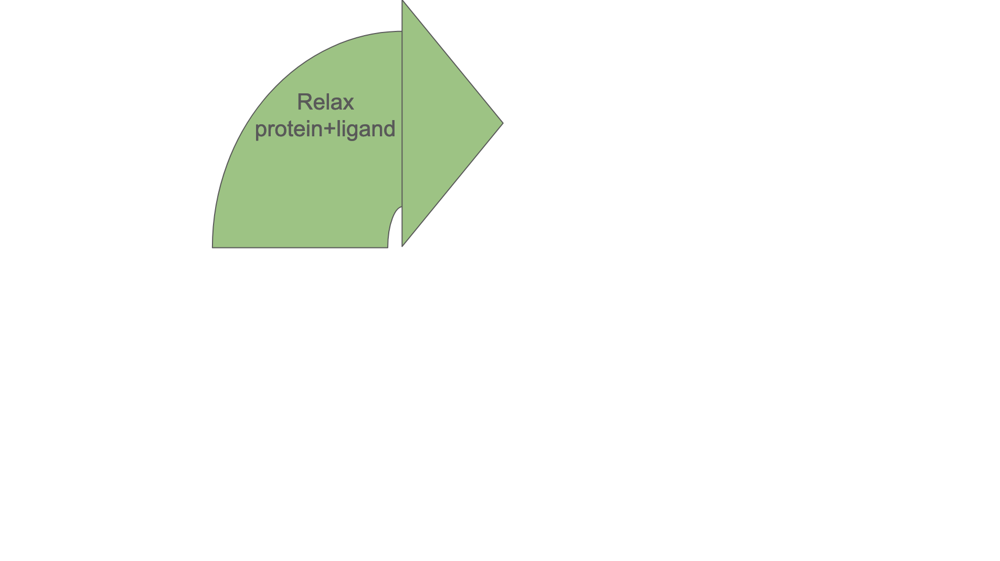

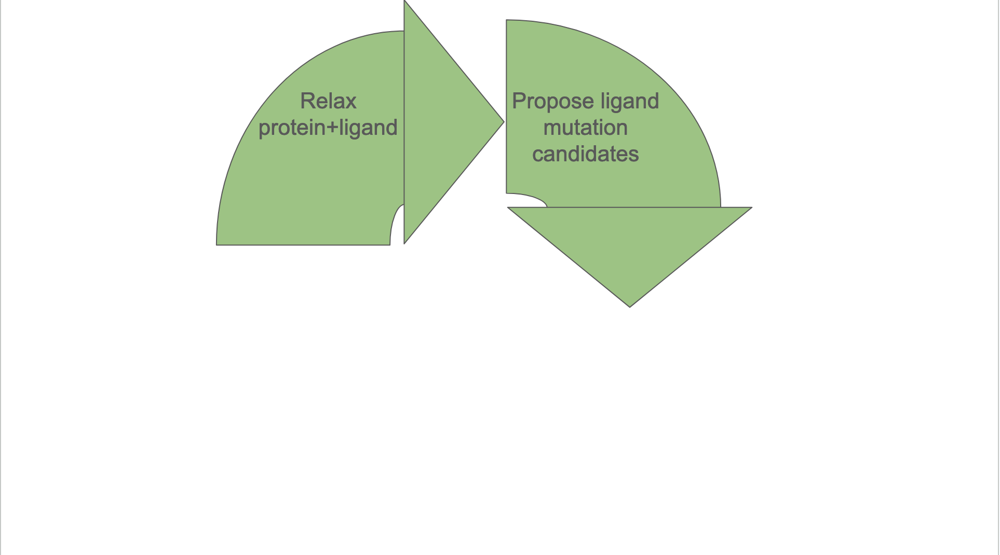

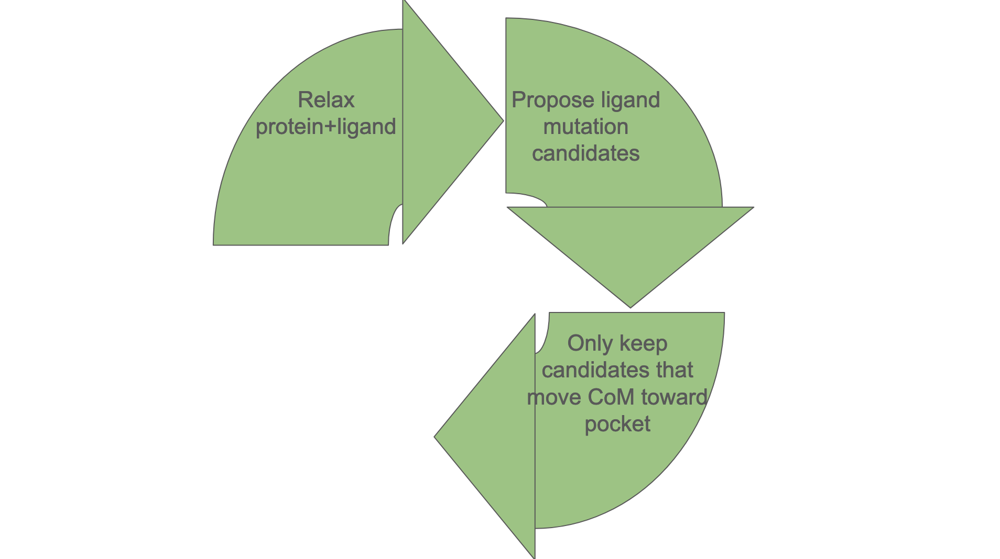

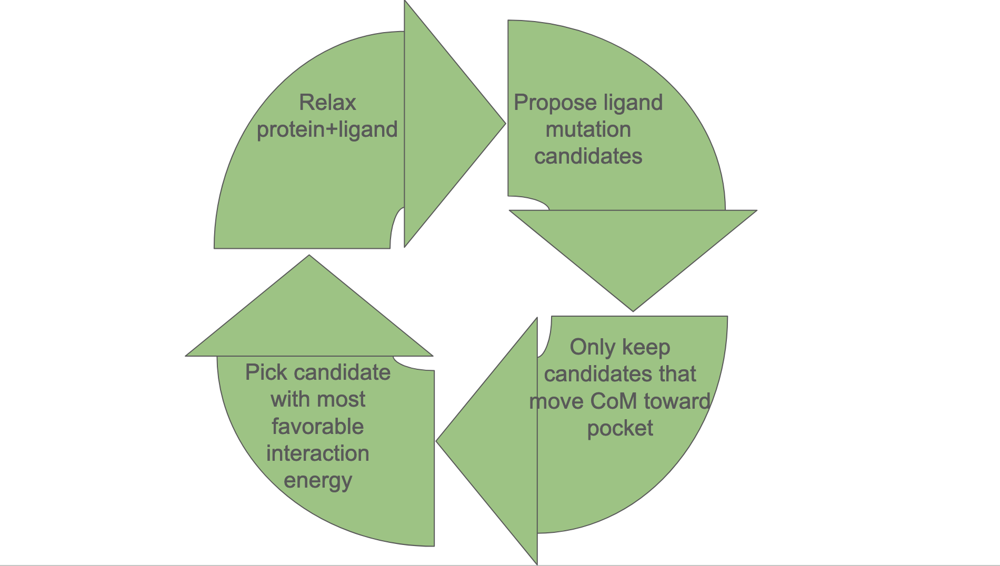



In [25]:
top = Topology.from_pdb(
    "complex_topology.pdb",
    unique_molecules=[Molecule.from_smiles("c12c(Cl)cccc1sc(C(=O)[O-])c(Cl)2")],
)
protein = top.molecule(0)
ligand = top.molecule(1)
view = top.visualize()
view.add_representation("surface", selection="protein")
view

NGLWidget()

## Some boilerplate code for reuse

In [17]:

def single_point_energy(
    simulation: Simulation, positions: Quantity, box_vectors: Quantity | None
) -> Quantity:
    """Calculate a single point energy with OpenMM"""
    simulation.context.setPositions(ensure_quantity(positions, "openmm"))
    if box_vectors is not None:
        simulation.context.setPeriodicBoxVectors(
            *ensure_quantity(box_vectors, "openmm")
        )
    state = simulation.context.getState(getEnergy=True)
    return ensure_quantity(state.getPotentialEnergy(), "openff")


def create_integrator() -> openmm.Integrator:
    return openmm.LangevinMiddleIntegrator(
        300 * omm_unit.kelvin,
        1 / omm_unit.picosecond,
        0.002 * omm_unit.picoseconds,
    )


In [23]:
%env INTERCHANGE_EXPERIMENTAL=1

env: INTERCHANGE_EXPERIMENTAL=1


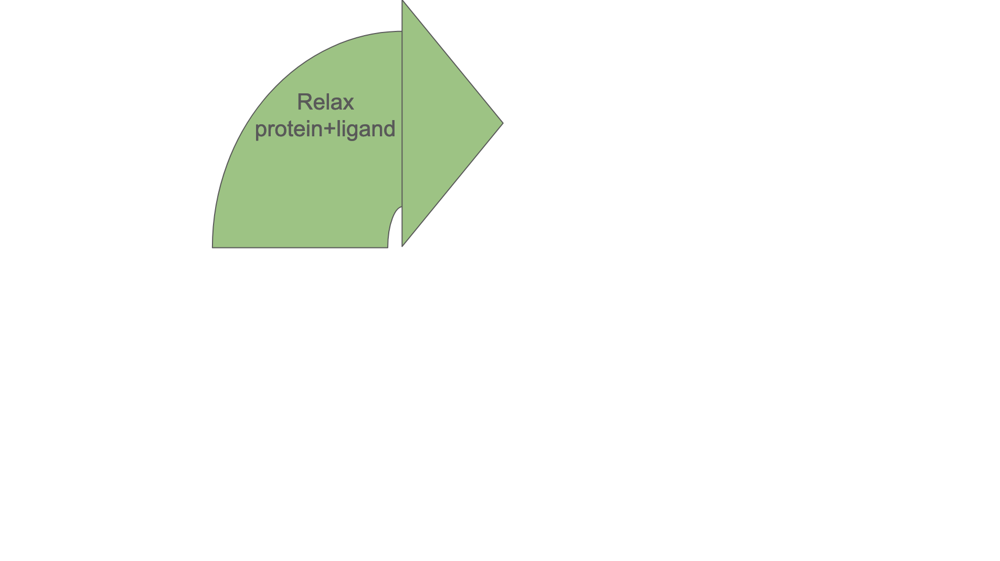

In [18]:
sage = ForceField("openff-2.2.0.offxml")

ff14sb = ForceField("ff14sb_off_impropers_0.0.4.offxml")

# NOTE: We easily make a more clash-forgiving ligand FF for mutation candidate evaluation
softened_ff = ForceField("openff-2.2.0.offxml")
for parameter in softened_ff.get_parameter_handler("vdW"):
    parameter.rmin_half *= 0.5

In [19]:
# NOTE: Interchange.combine lets us only make this expensive protein interchange once, and reuse it several times
protein_interchange = ff14sb.create_interchange(protein.to_topology())

In [20]:
protein_simulation = protein_interchange.to_openmm_simulation(create_integrator())

In [21]:
def relax_ligand(protein_interchange, ligand_offmol, ligand_ff, name=""):
    # Use NAGL to quickly charge the ligand
    ntkw = NAGLToolkitWrapper()
    ntkw.assign_partial_charges(ligand_offmol, "openff-gnn-am1bcc-0.1.0-rc.3.pt")
    ligand_interchange = sage.create_interchange(
        ligand_offmol.to_topology(), charge_from_molecules=[ligand_offmol]
    )
    # REUSE the protein interchange to make the complex
    complex_interchange = protein_interchange.combine(ligand_interchange)
    omm_sys = complex_interchange.to_openmm_system()
    omm_top = complex_interchange.to_openmm_topology()

    # "OPEN THE HOOD": Use OpenMM's API to apply restraints to backbone atoms and ligand scaffold
    restraint = openmm.CustomExternalForce("k*periodicdistance(x, y, z, x0, y0, z0)^2")
    omm_sys.addForce(restraint)
    restraint.addGlobalParameter(
        "k", 4000.0 * omm_unit.kilojoules_per_mole / omm_unit.angstrom
    )
    restraint.addPerParticleParameter("x0")
    restraint.addPerParticleParameter("y0")
    restraint.addPerParticleParameter("z0")

    for atom in omm_top.atoms():
        if atom.name in ["C", "O", "N", "CA", "S1X", "O1X", "O2X", "Cl1x", "Cl2x"]:
            restraint.addParticle(
                atom.index, complex_interchange.positions[atom.index].to_openmm()
            )
    # Minimize and run a short MD to relax the complex
    simulation = openmm.app.Simulation(omm_top, omm_sys, create_integrator())
    simulation.context.setPositions(complex_interchange.positions.to_openmm())
    simulation.minimizeEnergy()
    simulation.context.setVelocitiesToTemperature(300)
    simulation.step(1000)

    # Copy the final simulation positions back to the complex_interchange object
    state = simulation.context.getState(
        getPositions=True, getForces=True, getEnergy=True
    )
    omm_positions = state.getPositions()
    openmm.app.PDBFile.writeFile(
        simulation.topology, omm_positions, open(f"{name}.pdb", "w")
    )

    complex_interchange.positions = from_openmm(omm_positions)

    return complex_interchange, state

In [31]:
relaxed_interchange, state = relax_ligand(protein_interchange, ligand, sage, name="test")

view = nglview.show_file("test.pdb")
view.add_representation("surface", selection="protein")
view

[22:10:03] WARNING: Proton(s) added/removed



NGLWidget()

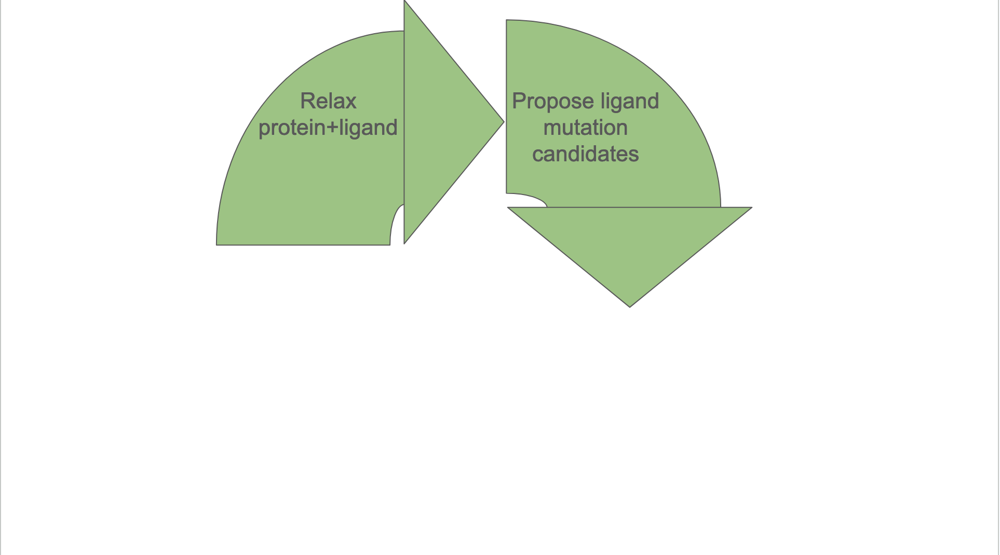

In [26]:
def mutate_ligand(ligand):
    ligand.partial_charges = None
    # NOTE: High quality interop with RDKit gives us access to a huge amount of functionality.
    rdmol = ligand.to_rdkit()
    reactions = [
        "[*:1]-[*X1:2] >> [*:1][C:2]",
        "[#6:1]-[#1:2] >> [*:1][N:2]",
        "[#6:1]-[#1:2] >> [*:1][O:2]",
    ]
    unsanitized_products = []
    for reaction in reactions:
        rxn = rdkit.Chem.rdChemReactions.ReactionFromSmarts(reaction)
        unsanitized_products.extend(rxn.RunReactants([rdmol]))

    products = list()
    for (product,) in unsanitized_products:
        mol_copy = rdkit.Chem.Mol(product)

        rdkit.Chem.SanitizeMol(mol_copy, rdkit.Chem.SANITIZE_ALL)
        rdkit.Chem.AssignStereochemistryFrom3D(mol_copy)
        rdkit.Chem.Kekulize(mol_copy, clearAromaticFlags=True)
        rdkit.Chem.SetAromaticity(mol_copy, rdkit.Chem.AromaticityModel.AROMATICITY_MDL)
        offmol = Molecule.from_rdkit(mol_copy)
        existing_metadata = [
            atom.metadata for atom in offmol.atoms if atom.metadata != {}
        ][0]
        for atom in offmol.atoms:
            atom.metadata.update(existing_metadata)
        products.append(offmol)
    return products


def display_molecule_grid(molecules, item_width=200):

    items = []
    for product in molecules:
        item = widgets.Output()
        item.append_display_data(product.visualize("rdkit", width=item_width))
        items.append(item)

    return widgets.GridBox(
        items,
        layout=widgets.Layout(grid_template_columns=f"repeat(3, {item_width+10}px)"),
    )

In [27]:
products = mutate_ligand(ligand)
display_molecule_grid(products)

GridBox(children=(Output(outputs=({'output_type': 'display_data', 'data': {'text/plain': '<IPython.core.displa…

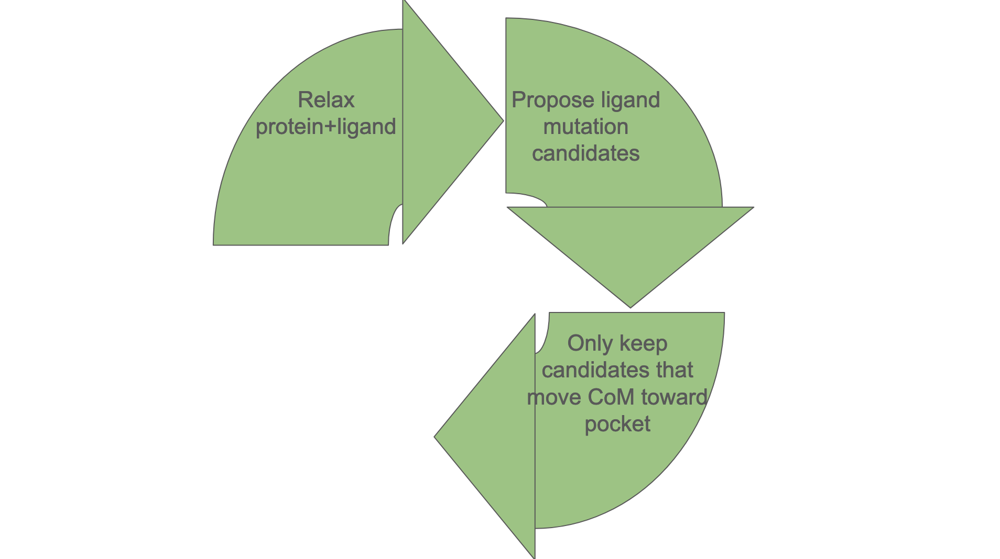

In [28]:
def naive_objective(ligand):
    # CD of LEU76
    target_coord = (4., 1., 9.)
    ligand_com = np.mean(ligand.conformers[0], axis=0).m_as(unit.angstrom)
    return np.linalg.norm(target_coord - ligand_com)
    
for product in products:
    print(product.to_smiles(), naive_objective(product))

[H][c]1[c]([Cl])[c]2[c]([c]([H])[c]1[C]([H])([H])[H])[S][C]([C](=[O])[O-])=[C]2[Cl] 10.209374636422632
[H][c]1[c]([H])[c]([C]([H])([H])[H])[c]([Cl])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl] 9.945328397054611
[H][c]1[c]([H])[c]([C]([H])([H])[H])[c]2[c]([c]1[Cl])[C]([Cl])=[C]([C](=[O])[O-])[S]2 10.549206313848744
[H][c]1[c]([H])[c]2[c]([c]([C]([H])([H])[H])[c]1[H])[C]([Cl])=[C]([C](=[O])[O-])[S]2 9.9871069452028
[H][c]1[c]([H])[c]([Cl])[c]2[c]([c]1[H])[S][C]([C](=[O])[C]([H])([H])[H])=[C]2[Cl] 10.872421426223216
[H][c]1[c]([H])[c]([Cl])[c]2[c]([c]1[H])[S][C]([C](=[O])[O-])=[C]2[C]([H])([H])[H] 10.327521622305852
[H][c]1[c]([Cl])[c]2[c]([c]([H])[c]1[N]([H])[H])[S][C]([C](=[O])[O-])=[C]2[Cl] 10.256678967988686
[H][c]1[c]([H])[c]([N]([H])[H])[c]([Cl])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl] 10.062894779259924
[H][c]1[c]([H])[c]([N]([H])[H])[c]2[c]([c]1[Cl])[C]([Cl])=[C]([C](=[O])[O-])[S]2 10.509421308986143
[H][O][c]1[c]([H])[c]([Cl])[c]2[c]([c]1[H])[S][C]([C](=[O])[O-])=[C]2[Cl] 10.357862759308

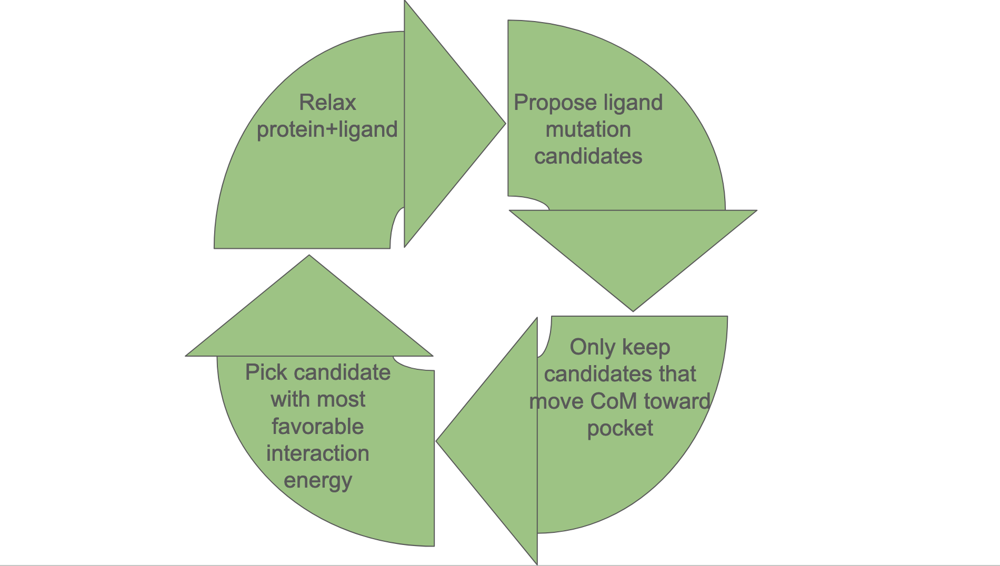

In [29]:
def interaction_objective(
    ligand: Molecule,
    previous_complex: Topology,
    protein_energy: Quantity,
    protein_interchange: Interchange,
    force_field: ForceField = softened_ff,
) -> Quantity:
    """
    Interaction energy between ligand and all but the last molecule in previous_complex.

    """
    # NOTE: Using nagl again to rapidly assign charges
    ntkw = NAGLToolkitWrapper()
    ntkw.assign_partial_charges(ligand, "openff-gnn-am1bcc-0.1.0-rc.3.pt")

    # NOTE: Calculate ligand energy
    ligand_interchange = force_field.create_interchange(
        ligand.to_topology(), charge_from_molecules=[ligand]
    )
    ligand_energy = get_openmm_energies(ligand_interchange).total_energy

    # NOTE: Get expensive complex_interchange for cheap by reusing protein_interchange
    complex_interchange = protein_interchange.combine(ligand_interchange)
    complex_energy = get_openmm_energies(complex_interchange).total_energy

    interaction_energy = complex_energy - protein_energy - ligand_energy
    return interaction_energy

In [30]:
candidates = [(top.molecule(1), 999)]
names = []

for idx in range(15):
    print(f"round {idx}")
    candidate, energy = candidates.pop(0)

    print(f"Relaxing candidate")
    name = str(idx)
    try:
        complex_interchange, state = relax_ligand(
            protein_interchange, candidate, sage, name=name
        )
    except ValueError as err:
        # If the simulation blows up, try with the next candidate
        print("Encountered error", err)
        continue
    names.append(name)
    relaxed_protein_positions = complex_interchange.positions[: protein.n_atoms]
    protein_interchange.positions = relaxed_protein_positions
    result_ligand = complex_interchange.topology.molecule(1)

    print(f"Computing protein point energy")
    protein_energy = single_point_energy(
        protein_simulation, relaxed_protein_positions, complex_interchange.box
    )

    print(f"generating mutations")
    mutations = mutate_ligand(result_ligand)
    print(f"pruning mutations by distance to target point")

    mutations = sorted(mutations, key=lambda x: naive_objective(x))[:3]
    print(f"evaluating mutations")
    candidates = []
    for mutation in mutations:
        print(f"computing {mutation}")

        candidates.append(
            (
                mutation,
                interaction_objective(
                    mutation,
                    complex_interchange.topology,
                    protein_energy,
                    protein_interchange,
                    softened_ff
                ),
            )
        )
        print(f"finished with energy {candidates[-1][1]}")

    candidates.sort(key=lambda x: x[1])

print("All done!")

round 0
Relaxing candidate


[21:56:07] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([C]([H])([H])[H])[c]([Cl])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:14] WARNING: Proton(s) added/removed



finished with energy -320.4839046841381 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]2[c]([c]([C]([H])([H])[H])[c]1[H])[C]([Cl])=[C]([C](=[O])[O-])[S]2'


[21:56:18] WARNING: Proton(s) added/removed



finished with energy -344.18715052541313 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([Cl])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:23] WARNING: Proton(s) added/removed



finished with energy -353.9334060323565 kilojoule / mole
round 1
Relaxing candidate


[21:56:27] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[C]([H])([H])[H])[c]([Cl])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:33] WARNING: Proton(s) added/removed



finished with energy 26.4367294427733 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[C]([H])([H])[H])[c]([Cl])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:38] WARNING: Proton(s) added/removed



finished with energy 32269.60736784442 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:42] WARNING: Proton(s) added/removed



finished with energy -210.63064948378994 kilojoule / mole
round 2
Relaxing candidate


[21:56:46] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:53] WARNING: Proton(s) added/removed



finished with energy -312.88980616731993 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[C]([H])([H])[H])[c]([C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:56:57] WARNING: Proton(s) added/removed



finished with energy -168.5639399535039 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[C]([H])([H])[H])[c]([C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:02] WARNING: Proton(s) added/removed



finished with energy 13107.726943568716 kilojoule / mole
round 3
Relaxing candidate


[21:57:06] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:13] WARNING: Proton(s) added/removed



finished with energy -289.79221799455433 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:18] WARNING: Proton(s) added/removed



finished with energy -326.4875196667829 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([H])[N]([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:23] WARNING: Proton(s) added/removed



finished with energy -321.04135120736714 kilojoule / mole
round 4
Relaxing candidate


[21:57:27] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([C]([H])([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:35] WARNING: Proton(s) added/removed



finished with energy -280.05109004847725 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:39] WARNING: Proton(s) added/removed



finished with energy 309.7788734960661 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:43] WARNING: Proton(s) added/removed



finished with energy 574.595809020072 kilojoule / mole
round 5
Relaxing candidate


[21:57:47] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:55] WARNING: Proton(s) added/removed



finished with energy 110.8312184659743 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:57:59] WARNING: Proton(s) added/removed



finished with energy 7116.703582940347 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:04] WARNING: Proton(s) added/removed



finished with energy 645.398082417632 kilojoule / mole
round 6
Relaxing candidate


[21:58:08] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:17] WARNING: Proton(s) added/removed



finished with energy 174.63247041675163 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:22] WARNING: Proton(s) added/removed



finished with energy 864330.6505717754 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:26] WARNING: Proton(s) added/removed



finished with energy 81.18461931038837 kilojoule / mole
round 7
Relaxing candidate


[21:58:31] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:41] WARNING: Proton(s) added/removed



finished with energy 386530.83231106744 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:46] WARNING: Proton(s) added/removed



finished with energy 386949.3083261431 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C@@]([H])([N]([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:58:50] WARNING: Proton(s) added/removed



finished with energy 439257.64806873666 kilojoule / mole
round 8
Relaxing candidate


[21:58:55] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:04] WARNING: Proton(s) added/removed



finished with energy 32757.18958508508 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:09] WARNING: Proton(s) added/removed



finished with energy 14575.592486332276 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:13] WARNING: Proton(s) added/removed



finished with energy 1774.3982334442398 kilojoule / mole
round 9
Relaxing candidate


[21:59:17] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:27] WARNING: Proton(s) added/removed



finished with energy 35643.602838165054 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:31] WARNING: Proton(s) added/removed



finished with energy 1361189.4335542715 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C@]([H])([N]([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:36] WARNING: Proton(s) added/removed



finished with energy 93298.81739129839 kilojoule / mole
round 10
Relaxing candidate


[21:59:40] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:50] WARNING: Proton(s) added/removed



finished with energy 235710.33063367306 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:55] WARNING: Proton(s) added/removed



finished with energy 21433.34644516181 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([C]([H])([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[21:59:59] WARNING: Proton(s) added/removed



finished with energy 50875429.74040264 kilojoule / mole
round 11
Relaxing candidate


[22:00:04] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([C]([H])([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:00:14] WARNING: Proton(s) added/removed



finished with energy 20515.231181887582 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:00:18] WARNING: Proton(s) added/removed



finished with energy 1808.546038443303 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:00:23] WARNING: Proton(s) added/removed



finished with energy -55.35434137913626 kilojoule / mole
round 12
Relaxing candidate


[22:00:27] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:00:39] WARNING: Proton(s) added/removed



finished with energy 12416943.75718418 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:00:44] WARNING: Proton(s) added/removed



finished with energy 1663410.788237359 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([H])[C]([H])([C]([H])([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:00:48] WARNING: Proton(s) added/removed



finished with energy 1708409.3409889205 kilojoule / mole
round 13
Relaxing candidate


[22:00:53] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:01:07] WARNING: Proton(s) added/removed



finished with energy 66719.8342286156 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([C]([H])([H])[C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:01:11] WARNING: Proton(s) added/removed



finished with energy 411564.6925424795 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C]([H])([C]([H])([H])[C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:01:15] WARNING: Proton(s) added/removed



finished with energy 58661.26953125 kilojoule / mole
round 14
Relaxing candidate


[22:01:20] WARNING: Proton(s) added/removed



Computing protein point energy
generating mutations
pruning mutations by distance to target point
evaluating mutations
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C@]([H])([C]([H])([H])[C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:01:32] WARNING: Proton(s) added/removed



finished with energy 38063.6953125 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C@@]([H])([C]([H])([H])[C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:01:37] WARNING: Proton(s) added/removed



finished with energy 167116.744140625 kilojoule / mole
computing Molecule with name '' and SMILES '[H][c]1[c]([H])[c]([N]([H])[H])[c]([C]([H])([H])[C@@]([H])([C]([H])([H])[H])[C]([H])([H])[C]([H])([H])[N]([H])[C]([H])([H])[N]([H])[C@]([H])([C]([H])([H])[C]([H])([H])[H])[C]([H])([C]([H])([H])[H])[C]([H])([H])[H])[c]2[c]1[S][C]([C](=[O])[O-])=[C]2[Cl]'


[22:01:41] WARNING: Proton(s) added/removed



finished with energy 52636.14453125 kilojoule / mole
All done!


In [32]:

big_pdb = ""
for name in names:
    pdb = Path(f"{name}.pdb")
    big_pdb += "MODEL\n" + pdb.read_text() + "ENDMDL\n"
Path("relaxation_trajectory.pdb").write_text(big_pdb)

view = nglview.show_structure_file("relaxation_trajectory.pdb")
view.add_surface(
    selection="protein",
    opacity=0.5,
    opaqueBack=False,
)


def handler(change):
    view._remote_call(
        "setSelection",
        target="compList",
        args=[f"/{change['new']}"],
        kwargs=dict(component_index=0),
    )


play = widgets.Play(
    value=0,
    min=0,
    max=14,
    interval=500,
)
slider = widgets.IntSlider(
    value=0,
    min=0,
    max=14,
)
slider.observe(handler, "value")
widgets.jslink((play, "value"), (slider, "value"))
controls = widgets.HBox([play, slider])
widgets.VBox([view, controls])

In [33]:
view = nglview.show_file("14.pdb")
view.add_representation("surface", selection="protein", opacity=0.7, opaqueBack=False)
view.add_component("4hw3_D_aligned.pdb")
view

NGLWidget()

## Do's and Don'ts of OpenFF's `from_rdkit` and `to_rdkit`

### DON'T have ambiguous stereochemistry

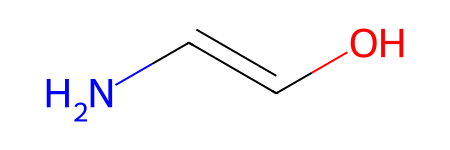

In [34]:
rdmol = rdkit.Chem.MolFromSmiles("OC=CN")
rdmol

In [35]:
offmol = Molecule.from_rdkit(rdmol)

UndefinedStereochemistryError: Unable to make OFFMol from RDMol: RDMol has unspecified stereochemistry. Bonds with undefined stereochemistry are:
 - Bond 1 (atoms 1-2 of element (C-C)


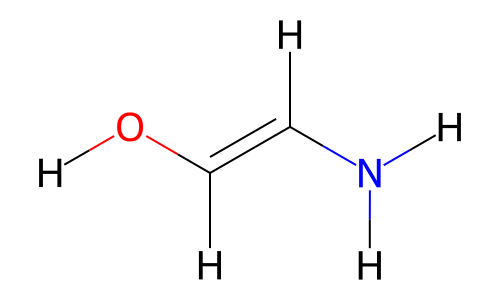

In [36]:
offmol = Molecule.from_rdkit(rdmol, allow_undefined_stereo=True)
offmol

In [37]:
cis_rdmol = rdkit.Chem.MolFromSmiles(r"O/C=C\N")
cis_offmol = Molecule.from_rdkit(cis_rdmol)
cis_offmol.assign_partial_charges("am1bcc")
trans_rdmol = rdkit.Chem.MolFromSmiles(r"O/C=C/N")
trans_offmol = Molecule.from_rdkit(trans_rdmol)
trans_offmol.assign_partial_charges("am1bcc")
print(cis_offmol.partial_charges - trans_offmol.partial_charges)

[-0.025000000000000022 -0.05999999999999997 0.10100000000000003 -0.020000000000000018 0.0010000000000000009 -0.032999999999999974 0.0030000000000000304 0.016500000000000015 0.016500000000000015] elementary_charge


### DO be very careful when loading from PDB

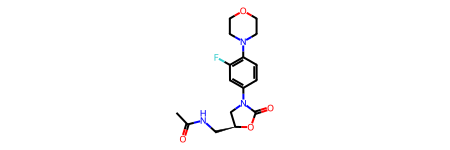

In [38]:
rdmol = rdkit.Chem.MolFromMolFile("linezolid_ambertools_charges.sdf")
rdmol

[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not removing hydrogen atom without neighbors
[22:15:26] WARNING: not r

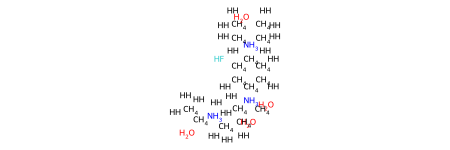

In [39]:
rdmol = rdkit.Chem.MolFromPDBFile("linezolid_no_conect.pdb", proximityBonding=False)
rdmol

In [40]:
rdmol = rdkit.Chem.MolFromPDBFile("linezolid_no_conect.pdb", proximityBonding=True)
rdmol

[22:15:37] Explicit valence for atom # 1 C, 6, is greater than permitted


[22:15:50] WARNING: could not find number of expected rings. Switching to an approximate ring finding algorithm.


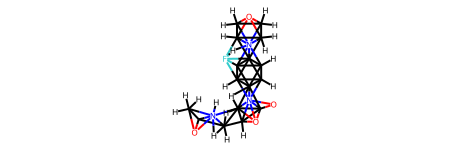

In [41]:
rdmol = rdkit.Chem.MolFromPDBFile("linezolid_no_conect.pdb", proximityBonding=True, sanitize=False)
rdmol

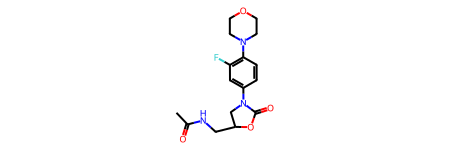

In [42]:
rdmol = rdkit.Chem.MolFromPDBFile("linezolid.pdb", proximityBonding=False)
rdmol

### DO ensure that each "molecule" is one fragment

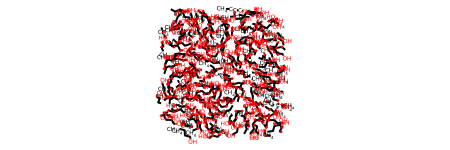

In [43]:
rdmol = rdkit.Chem.MolFromPDBFile("propane_methane_butanol_0.2_0.3_0.5.pdb")
rdmol

In [44]:
top = Topology()
for frag in rdkit.Chem.GetMolFrags(rdmol, asMols=True):
    top.add_molecule(Molecule.from_rdkit(frag))
top.visualize()

NGLWidget()

In [45]:
interchange = forcefield.create_interchange(top)
simulate_and_visualize(interchange)

NGLWidget(max_frame=99)

### DO add explicit formal charge and bond orders

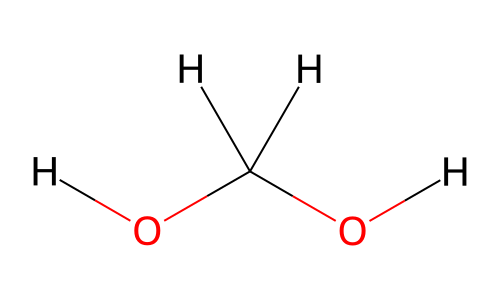

In [46]:
bad_acetate_smiles = "C(O)O"
rdmol = rdkit.Chem.MolFromSmiles(bad_acetate_smiles)
offmol = Molecule.from_rdkit(rdmol)
offmol

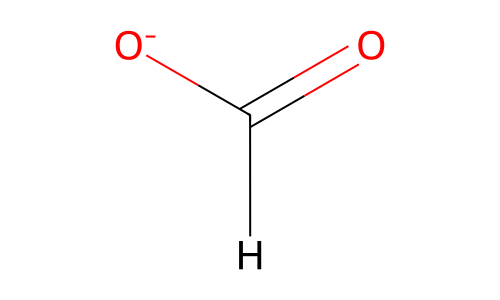

In [47]:
good_acetate_smiles = "C(=O)[O-]"
rdmol = rdkit.Chem.MolFromSmiles(good_acetate_smiles)
offmol = Molecule.from_rdkit(rdmol)
offmol

### DON'T try to simulate radicals (or incomplete molecules/substructures)

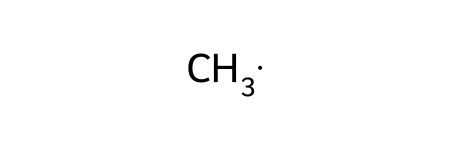

In [48]:
rd_methyl_radical = rdkit.Chem.MolFromSmiles("[C]([H])([H])([H])")
rd_methyl_radical

In [49]:
offmol.from_rdkit(rd_methyl_radical)

RadicalsNotSupportedError: The OpenFF Toolkit does not currently support parsing molecules with S- and P-block radicals. Found 1 radical electrons on molecule [H][C]([H])[H].

### DON'T try to simulate metals (we don't have bonded parameters or charge methods for them yet)

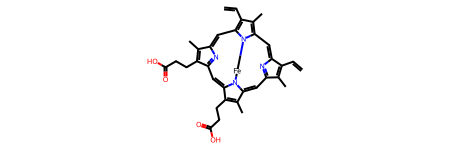

In [50]:
rd_heme = rdkit.Chem.MolFromSmiles("OC(=O)CC/C6=C(\C)/C=3/N=C6/C=C2/C(/CCC(O)=O)=C(/C)\C1=C\C5=N\C(=C/c4n([Fe]N12)c(C=3)c(C=C)c4C)C(\C=C)=C5\C")
rd_heme

In [51]:
off_heme = Molecule.from_rdkit(rd_heme)
interchange = forcefield.create_interchange(off_heme.to_topology())

UnassignedBondError: BondHandler was not able to find parameters for the following valence terms:

- Topology indices (28, 29): names and elements ( N), ( Fe), 
- Topology indices (29, 30): names and elements ( Fe), ( N), 


### DO expect your aromaticity to be re-percieved using MDL

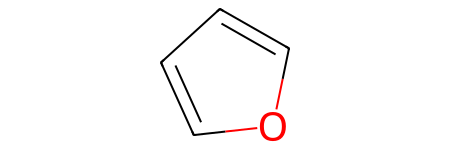

In [52]:
rd_furan = rdkit.Chem.MolFromSmiles("c1cocc1")
rd_furan

In [53]:
print(rd_furan.GetAtomWithIdx(0).GetIsAromatic())

True


In [54]:
off_furan = Molecule.from_rdkit(rd_furan)
print(off_furan.atom(0).is_aromatic)

False


### DON'T treat coordinates as mandatory - They're optional!

In [55]:
rd_ligand = rdkit.Chem.MolFromMolFile("posed_ligand.sdf")
off_ligand = Molecule.from_rdkit(rd_ligand)
interchange = forcefield.create_interchange(off_ligand.to_topology())
off_ligand

NGLWidget()

In [56]:
simulate_and_visualize(interchange)

NGLWidget(max_frame=99)

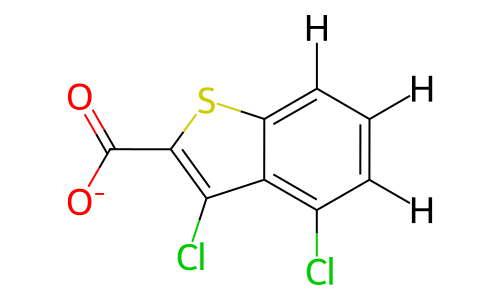

In [57]:
rd_ligand = rdkit.Chem.MolFromMolFile("posed_ligand.sdf")
rd_ligand.RemoveAllConformers()
off_ligand = Molecule.from_rdkit(rd_ligand)
interchange = forcefield.create_interchange(off_ligand.to_topology())
off_ligand

In [58]:
simulate_and_visualize(interchange)

OpenMMException: Particle positions have not been set

### DO sanitize your molecules after modifying them in RDKit

In [59]:
ligand = Molecule.from_file("posed_ligand.sdf")
# NOTE: High quality interop with RDKit gives us access to a huge amount of functionality.
rdmol = ligand.to_rdkit()
reaction = "[#6:1]-[Cl:2] >> [*:1][N:2]"
rxn = rdkit.Chem.rdChemReactions.ReactionFromSmarts(reaction)
unsanitized_products = rxn.RunReactants([rdmol])

In [60]:
Molecule.from_rdkit(unsanitized_products[0][0])

[22:21:10] 

****
Pre-condition Violation
getNumImplicitHs() called without preceding call to calcImplicitValence()
Violation occurred on line 289 in file /Users/runner/miniforge3/conda-bld/rdkit-meta_1722844984124/work/Code/GraphMol/Atom.cpp
Failed Expression: d_implicitValence > -1
****



RuntimeError: Pre-condition Violation
	getNumImplicitHs() called without preceding call to calcImplicitValence()
	Violation occurred on line 289 in file Code/GraphMol/Atom.cpp
	Failed Expression: d_implicitValence > -1
	RDKIT: 2024.03.5
	BOOST: 1_84


In [61]:
products = list()
for (product,) in unsanitized_products:
    mol_copy = rdkit.Chem.Mol(product)

    rdkit.Chem.SanitizeMol(mol_copy, rdkit.Chem.SANITIZE_ALL)
    rdkit.Chem.AssignStereochemistryFrom3D(mol_copy)
    rdkit.Chem.Kekulize(mol_copy, clearAromaticFlags=True)
    rdkit.Chem.SetAromaticity(mol_copy, rdkit.Chem.AromaticityModel.AROMATICITY_MDL)
    offmol = Molecule.from_rdkit(mol_copy)
    products.append(offmol)
products[0]

NGLWidget()

### DO read up on how properties and [PDB hierarchy metadata](https://docs.openforcefield.org/projects/toolkit/en/stable/users/molecule_conversion.html) (residues, chains, etc) are converted between RDKit and OpenFF 
(Atom order is guaranteed to remain constant when going between OpenFF and RDKit!)

In [62]:
off_protein = Topology.from_pdb("selected_prediction_aligned.pdb").molecule(0)
print(off_protein.atom(0).metadata)

{'residue_name': 'GLY', 'residue_number': '1', 'insertion_code': ' ', 'chain_id': 'A', 'match_info': '{"59": ["GLY", 0]}'}


In [63]:
rd_protein = off_protein.to_rdkit()
resinfo = rd_protein.GetAtomWithIdx(0).GetPDBResidueInfo()
print(resinfo.GetResidueName(), resinfo.GetResidueNumber(), resinfo.GetChainId())

GLY 1 A


In [64]:
off_protein.properties

{}

In [65]:
off_protein.properties['foo'] = 'bar'
rd_protein = off_protein.to_rdkit()
rd_protein.GetPropsAsDict()

{'foo': 'bar'}

# NAGL can quickly and accurately provide AM1BCC-ELF10 charges

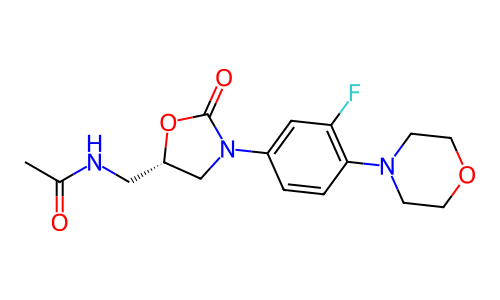

In [34]:
linezolid = Molecule.from_smiles("O=C1O[C@@H](CNC(=O)C)CN1c3cc(F)c(N2CCOCC2)cc3")

linezolid.visualize(show_all_hydrogens=False)

In [35]:
#AmberToolsToolkitWrapper().assign_partial_charges(linezolid, "am1bcc")

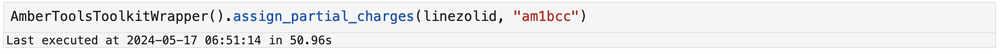

In [36]:
#linezolid.to_file("linezolid_ambertools_charges.sdf", file_format="sdf")

In [37]:
NAGLToolkitWrapper().assign_partial_charges(linezolid, 
                                            "openff-gnn-am1bcc-0.1.0-rc.3.pt")


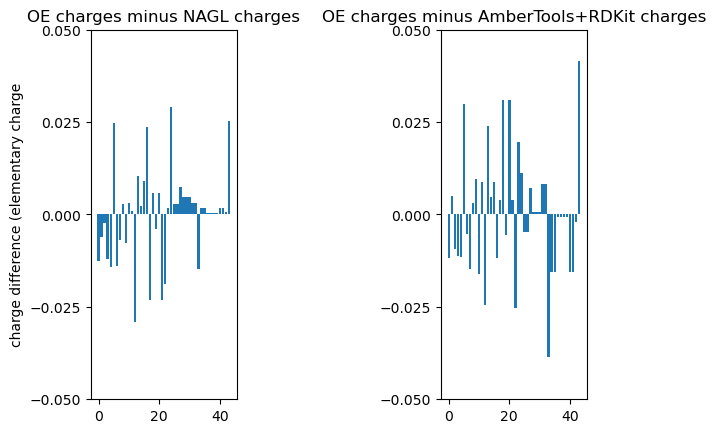

In [38]:
from matplotlib import pyplot
linezolid_at_charges = Molecule.from_file("linezolid_ambertools_charges.sdf")
linezolid_oe_charges = Molecule.from_file("linezolid_openeye_charges.sdf")
pyplot.subplot(1,3,1)
pyplot.bar(range(linezolid.n_atoms), 
           (linezolid_oe_charges.partial_charges - linezolid.partial_charges).m_as(unit.elementary_charge),
          )
pyplot.title("OE charges minus NAGL charges")
pyplot.ylabel("charge difference (elementary charge")
pyplot.yticks([-0.05, -0.025, 0, 0.025, 0.05])
pyplot.subplot(1,3,3)
pyplot.bar(range(linezolid.n_atoms), 
           (linezolid_oe_charges.partial_charges - linezolid_at_charges.partial_charges).m_as(unit.elementary_charge),
          )
pyplot.yticks([-0.05, -0.025, 0, 0.025, 0.05])

pyplot.title("OE charges minus AmberTools+RDKit charges")
pyplot.show()

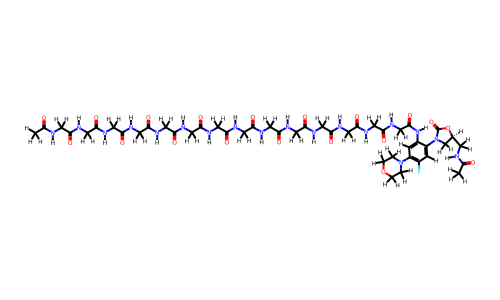

In [57]:
linezolid_15gly = Molecule.from_smiles("O=C1O[C@@H](CNC(=O)C)CN1c3cc(F)c(N2CCOCC2)cc3"+"NC(=O)C" * 15)
linezolid_15gly.visualize()

In [58]:
%%time
NAGLToolkitWrapper().assign_partial_charges(linezolid_15gly, 
                                            "openff-gnn-am1bcc-0.1.0-rc.3.pt")

CPU times: user 968 ms, sys: 92.7 ms, total: 1.06 s
Wall time: 1.14 s


# Interchange has gained major interoperability features in the last year



In [64]:
ligand = Molecule.from_file("posed_ligand.sdf")
sage = ForceField("openff-2.2.0.offxml")
ligand_interchange = sage.create_interchange(ligand.to_topology())

protein = Topology.from_pdb("selected_prediction_aligned.pdb")
ff14sb = ForceField("ff14sb_off_impropers_0.0.4.offxml")
protein_interchange = ff14sb.create_interchange(protein)

In [14]:
env INTERCHANGE_EXPERIMENTAL=1

env: INTERCHANGE_EXPERIMENTAL=1


In [71]:
complex_interchange = protein_interchange.combine(ligand_interchange)

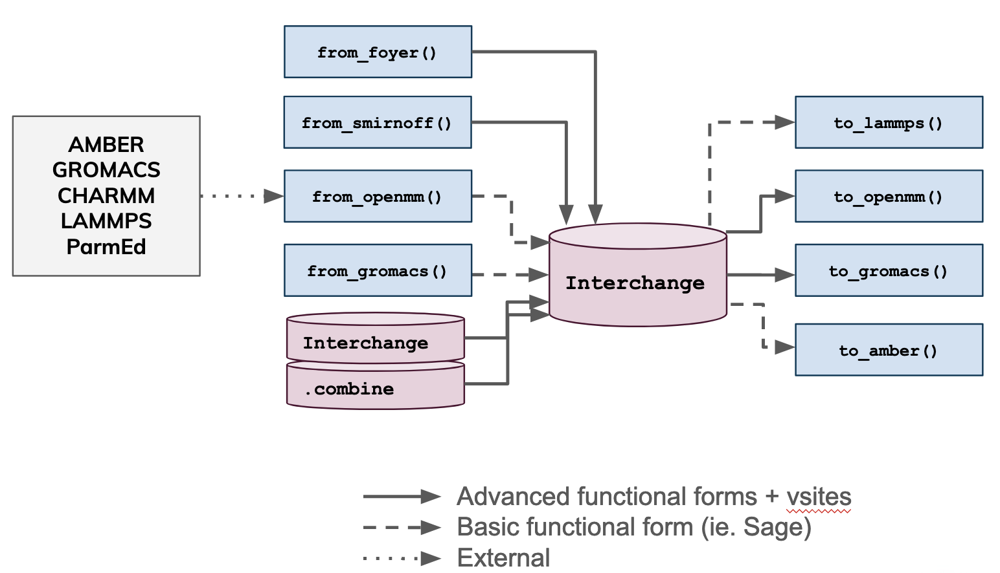

In [72]:
complex_interchange.visualize()

NGLWidget()

In [74]:
from openff.interchange.drivers.all import get_summary_data
#complex_interchange.box = protein_interchange.box
complex_interchange.box = [10, 10, 10] * unit.nanometer
summary = get_summary_data(complex_interchange, )
summary

/Users/jeffreywagner/conda/envs/offtk-examples/lib/python3.11/site-packages/openff/interchange/components/mdconfig.py:463: UserWarning: Ambiguous failure while processing constraints. Constraining h-bonds as a stopgap.
  warnings.warn(
/Users/jeffreywagner/conda/envs/offtk-examples/lib/python3.11/site-packages/openff/interchange/components/mdconfig.py:463: UserWarning: Ambiguous failure while processing constraints. Constraining h-bonds as a stopgap.
  warnings.warn(
/Users/jeffreywagner/conda/envs/offtk-examples/lib/python3.11/site-packages/openff/interchange/components/mdconfig.py:275: SwitchingFunctionNotImplementedWarning: A switching distance 8.0 angstrom was specified by the force field, but LAMMPS may not implement a switching function as specified by SMIRNOFF. Using a hard cut-off instead. Non-bonded interactions will be affected.
  warnings.warn(


,Bond,Angle,Torsion,Electrostatics,vdW,RBTorsion
OpenMM,316.944856,1197.621693,7315.867467,-25152.675598,1.501957e+08,NaN
Amber,316.297430,1197.621884,7315.867511,-25151.936925,1.501957e+08,NaN
GROMACS,316.299500,1197.618042,7315.866859,-25155.445312,1.501961e+08,0.0
LAMMPS,316.944856,1197.621693,7511.113969,-25167.453280,1.501956e+08,NaN


* NAGL is able to quickly and accurately assign AM1BCC ELF10 charges, and is undergoing final validation.
* Interchange has gained major interoperability capabilities in the last year.